# Capstone Project: Create a Customer Segmentation Report for Arvato Financial Services

In this project, you will analyze demographics data for customers of a mail-order sales company in Germany, comparing it against demographics information for the general population. You'll use unsupervised learning techniques to perform customer segmentation, identifying the parts of the population that best describe the core customer base of the company. Then, you'll apply what you've learned on a third dataset with demographics information for targets of a marketing campaign for the company, and use a model to predict which individuals are most likely to convert into becoming customers for the company. The data that you will use has been provided by our partners at Bertelsmann Arvato Analytics, and represents a real-life data science task.

If you completed the first term of this program, you will be familiar with the first part of this project, from the unsupervised learning project. The versions of those two datasets used in this project will include many more features and has not been pre-cleaned. You are also free to choose whatever approach you'd like to analyzing the data rather than follow pre-determined steps. In your work on this project, make sure that you carefully document your steps and decisions, since your main deliverable for this project will be a blog post reporting your findings.

In [1]:
# import libraries here; add more as necessary
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import os
import math
from sklearn.preprocessing import Imputer, StandardScaler
import workspace_utils
from sklearn.model_selection import train_test_split
from sklearn import datasets
import time
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from workspace_utils import active_session



# magic word for producing visualizations in notebook
%matplotlib inline

## Part 0: Get to Know the Data

There are four data files associated with this project:

- `Udacity_AZDIAS_052018.csv`: Demographics data for the general population of Germany; 891 211 persons (rows) x 366 features (columns).
- `Udacity_CUSTOMERS_052018.csv`: Demographics data for customers of a mail-order company; 191 652 persons (rows) x 369 features (columns).
- `Udacity_MAILOUT_052018_TRAIN.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 982 persons (rows) x 367 (columns).
- `Udacity_MAILOUT_052018_TEST.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 833 persons (rows) x 366 (columns).

Each row of the demographics files represents a single person, but also includes information outside of individuals, including information about their household, building, and neighborhood. Use the information from the first two files to figure out how customers ("CUSTOMERS") are similar to or differ from the general population at large ("AZDIAS"), then use your analysis to make predictions on the other two files ("MAILOUT"), predicting which recipients are most likely to become a customer for the mail-order company.

The "CUSTOMERS" file contains three extra columns ('CUSTOMER_GROUP', 'ONLINE_PURCHASE', and 'PRODUCT_GROUP'), which provide broad information about the customers depicted in the file. The original "MAILOUT" file included one additional column, "RESPONSE", which indicated whether or not each recipient became a customer of the company. For the "TRAIN" subset, this column has been retained, but in the "TEST" subset it has been removed; it is against that withheld column that your final predictions will be assessed in the Kaggle competition.

Otherwise, all of the remaining columns are the same between the three data files. For more information about the columns depicted in the files, you can refer to two Excel spreadsheets provided in the workspace. [One of them](./DIAS Information Levels - Attributes 2017.xlsx) is a top-level list of attributes and descriptions, organized by informational category. [The other](./DIAS Attributes - Values 2017.xlsx) is a detailed mapping of data values for each feature in alphabetical order.

In the below cell, we've provided some initial code to load in the first two datasets. Note for all of the `.csv` data files in this project that they're semicolon (`;`) delimited, so an additional argument in the [`read_csv()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.read_csv.html) call has been included to read in the data properly. Also, considering the size of the datasets, it may take some time for them to load completely.

You'll notice when the data is loaded in that a warning message will immediately pop up. Before you really start digging into the modeling and analysis, you're going to need to perform some cleaning. Take some time to browse the structure of the data and look over the informational spreadsheets to understand the data values. Make some decisions on which features to keep, which features to drop, and if any revisions need to be made on data formats. It'll be a good idea to create a function with pre-processing steps, since you'll need to clean all of the datasets before you work with them.

In [2]:
# load in the data
azdias = pd.read_csv('../../data/Term2/capstone/arvato_data/Udacity_AZDIAS_052018.csv', sep=';')
customers = pd.read_csv('../../data/Term2/capstone/arvato_data/Udacity_CUSTOMERS_052018.csv', sep=';')

/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
# Be sure to add in a lot more cells (both markdown and code) to document your
# approach and findings!

In [4]:
azdias.describe()

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
count,8.912210e+05,891221.000000,817722.000000,817722.000000,81058.000000,29499.000000,6170.000000,1205.000000,628274.000000,798073.000000,...,770025.000000,815304.000000,815304.000000,815304.000000,783619.000000,817722.000000,798073.000000,891221.000000,891221.000000,891221.000000
mean,6.372630e+05,-0.358435,4.421928,10.864126,11.745392,13.402658,14.476013,15.089627,13.700717,8.287263,...,2.417322,6.001214,7.532130,5.945972,3.933406,7.908791,4.052836,3.362438,1.522098,2.777398
std,2.572735e+05,1.198724,3.638805,7.639683,4.097660,3.243300,2.712427,2.452932,5.079849,15.628087,...,1.166572,2.856091,3.247789,2.771464,1.964701,1.923137,1.949539,1.352704,0.499512,1.068775
min,1.916530e+05,-1.000000,1.000000,0.000000,2.000000,2.000000,4.000000,7.000000,0.000000,0.000000,...,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000
25%,4.144580e+05,-1.000000,1.000000,0.000000,8.000000,11.000000,13.000000,14.000000,11.000000,1.000000,...,2.000000,3.000000,5.000000,4.000000,2.000000,8.000000,3.000000,3.000000,1.000000,2.000000
50%,6.372630e+05,-1.000000,3.000000,13.000000,12.000000,14.000000,15.000000,15.000000,14.000000,4.000000,...,2.000000,6.000000,8.000000,6.000000,4.000000,9.000000,3.000000,3.000000,2.000000,3.000000
75%,8.600680e+05,-1.000000,9.000000,17.000000,15.000000,16.000000,17.000000,17.000000,17.000000,9.000000,...,3.000000,9.000000,10.000000,8.000000,6.000000,9.000000,5.000000,4.000000,2.000000,4.000000
max,1.082873e+06,3.000000,9.000000,21.000000,18.000000,18.000000,18.000000,18.000000,25.000000,595.000000,...,4.000000,11.000000,13.000000,11.000000,6.000000,9.000000,8.000000,6.000000,2.000000,9.000000


In [5]:
azdias.isnull().sum().sum()

33492923

In [6]:
azdias.head()

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,910215,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,1,2
1,910220,-1,9.0,0.0,NaN,NaN,NaN,NaN,21.0,11.0,...,4.0,8.0,11.0,10.0,3.0,9.0,4.0,5,2,1
2,910225,-1,9.0,17.0,NaN,NaN,NaN,NaN,17.0,10.0,...,2.0,9.0,9.0,6.0,3.0,9.0,2.0,5,2,3
3,910226,2,1.0,13.0,NaN,NaN,NaN,NaN,13.0,1.0,...,0.0,7.0,10.0,11.0,NaN,9.0,7.0,3,2,4
4,910241,-1,1.0,20.0,NaN,NaN,NaN,NaN,14.0,3.0,...,2.0,3.0,5.0,4.0,2.0,9.0,3.0,4,1,3


In [7]:
customers[['CUSTOMER_GROUP', 'ONLINE_PURCHASE', 'PRODUCT_GROUP']]

,CUSTOMER_GROUP,ONLINE_PURCHASE,PRODUCT_GROUP
0,MULTI_BUYER,0,COSMETIC_AND_FOOD
1,SINGLE_BUYER,0,FOOD
2,MULTI_BUYER,0,COSMETIC_AND_FOOD
3,MULTI_BUYER,0,COSMETIC
4,MULTI_BUYER,0,FOOD
5,MULTI_BUYER,0,COSMETIC_AND_FOOD
6,MULTI_BUYER,0,COSMETIC_AND_FOOD
7,SINGLE_BUYER,0,FOOD
8,MULTI_BUYER,0,COSMETIC
9,MULTI_BUYER,0,COSMETIC


In [8]:
customers.drop(['CUSTOMER_GROUP', 'ONLINE_PURCHASE', 'PRODUCT_GROUP'], axis=1, inplace=True)

In [9]:
attribs = pd.read_excel('./DIAS Information Levels - Attributes 2017.xlsx')
attribs1 = pd.read_excel('./DIAS Attributes - Values 2017.xlsx')

In [10]:
attribs1 = attribs1.drop(columns='Unnamed: 0')

In [11]:
feat = attribs['Attribute']
attribs1['Attribute']=attribs1['Attribute'].ffill()
attribs1.head()

    

,Attribute,Description,Value,Meaning
0,AGER_TYP,best-ager typology,-1,unknown
1,AGER_TYP,NaN,0,no classification possible
2,AGER_TYP,NaN,1,passive elderly
3,AGER_TYP,NaN,2,cultural elderly
4,AGER_TYP,NaN,3,experience-driven elderly


In [12]:
attribs1['Meaning'].value_counts()


unknown                                                                             232
average                                                                             162
low                                                                                 154
high                                                                                154
very high                                                                           142
very low                                                                            139
none                                                                                138
Doublebuyer 0-12 months                                                              34
Singlebuyer 0-12 months                                                              34
Multibuyer 0-12 months                                                               34
Multi-/Doublebuyer 13-24 months                                                      34
no transaction known            

In [13]:
missing_att = attribs1[attribs1['Meaning'].isin(['unknown','no transaction known',
                                             'no transactions known','none'])]
#no_class = attribs1.loc[attribs1['Meaning'], ['Value', 'Attribute']]
missing_att_df = pd.DataFrame(missing_att)
missing_att_df.set_index('Attribute', inplace=True)
missing_att_df = missing_att_df.drop_duplicates()

missing_att_df.head()
print(missing_att_df['Value'].dtype)


                  

object


In [14]:
arr_val = missing_att_df['Value'].str.replace('[','').str.replace(']','').str.split(',')
arr_test = []
for i in missing_att_df['Value']:

    if type(i) == "<class 'str'>":
        print(i)
        
    



In [15]:
missing_att_df.head()

,Description,Value,Meaning
Attribute,,,
AGER_TYP,best-ager typology,-1,unknown
ALTERSKATEGORIE_GROB,age classification through prename analysis,"-1, 0",unknown
ANREDE_KZ,gender,"-1, 0",unknown
BALLRAUM,distance to next urban centre,-1,unknown
BIP_FLAG,business-flag indicating companies in the buil...,-1,unknown


In [16]:
#create iterable col of vals to transform to nan in azdias
arr = missing_att_df['Value']

arr2 = []
for i in arr:
    try:
        i = int(i)
        arr2.append([i])
    except ValueError:
        j = i.replace('[','').replace(']','').split(',')
        j[0], j[1]=int(j[0]),int(j[1])
        arr2.append(j)

missing_val_col = np.array([np.array(xi) for xi in arr2])
#print(missing_val_col[0].dtype)
missing_att_df['missing_vals']=missing_val_col
#print(azdias['AGER_TYP'][0]==arr2[0])
missing_att_df.head()
  

,Description,Value,Meaning,missing_vals
Attribute,,,,
AGER_TYP,best-ager typology,-1,unknown,[-1]
ALTERSKATEGORIE_GROB,age classification through prename analysis,"-1, 0",unknown,"[-1, 0]"
ANREDE_KZ,gender,"-1, 0",unknown,"[-1, 0]"
BALLRAUM,distance to next urban centre,-1,unknown,[-1]
BIP_FLAG,business-flag indicating companies in the buil...,-1,unknown,[-1]


In [17]:
azdias.head()

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,910215,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,1,2
1,910220,-1,9.0,0.0,NaN,NaN,NaN,NaN,21.0,11.0,...,4.0,8.0,11.0,10.0,3.0,9.0,4.0,5,2,1
2,910225,-1,9.0,17.0,NaN,NaN,NaN,NaN,17.0,10.0,...,2.0,9.0,9.0,6.0,3.0,9.0,2.0,5,2,3
3,910226,2,1.0,13.0,NaN,NaN,NaN,NaN,13.0,1.0,...,0.0,7.0,10.0,11.0,NaN,9.0,7.0,3,2,4
4,910241,-1,1.0,20.0,NaN,NaN,NaN,NaN,14.0,3.0,...,2.0,3.0,5.0,4.0,2.0,9.0,3.0,4,1,3


In [18]:
# Drop LNR
azdias.drop(['LNR'], axis=1, inplace=True)

In [19]:
#function that returns % of missing data in Descending order
def missing_data(df):
    
    miss_data = df.isnull().sum()
    perc = np.round(miss_data*100/len(azdias),2)
    data_dict={
        'Total':miss_data.values,
        'Percentage':perc
    }
    
    missing_frame = pd.DataFrame(data=data_dict , index=miss_data.index)
    return missing_frame.sort_values(by='Total', ascending=False)
miss_az = missing_data(azdias)
miss_cust = missing_data(customers)

In [20]:
def missing_data_row(df):
    
    miss_data = df.isnull().sum(axis=1)
    perc = np.round(miss_data*100/len(azdias.columns),2)
    data_dict={
        'Total':miss_data.values,
        'Percentage':perc
    }
    
    missing_frame = pd.DataFrame(data=data_dict , index=miss_data.index)
    return missing_frame.sort_values(by='Total', ascending=False)
miss_azr = missing_data_row(azdias)


In [21]:
miss_az.head()

,Total,Percentage
ALTER_KIND4,890016,99.86
ALTER_KIND3,885051,99.31
ALTER_KIND2,861722,96.69
ALTER_KIND1,810163,90.90
EXTSEL992,654153,73.40


In [22]:
under_twenty_az = miss_az[miss_az['Percentage']<20]
missing_twenty_az = miss_az[miss_az['Percentage']>20]
top_50_az= pd.DataFrame(miss_az[:50])
under_twenty_cust=miss_cust[miss_cust['Percentage']<20]
missing_twenty_cust = miss_cust[miss_cust['Percentage']>20]
top_50_cust = pd.DataFrame(miss_cust[:50])

Text(0.5,1,'Top 50 missing Cust')

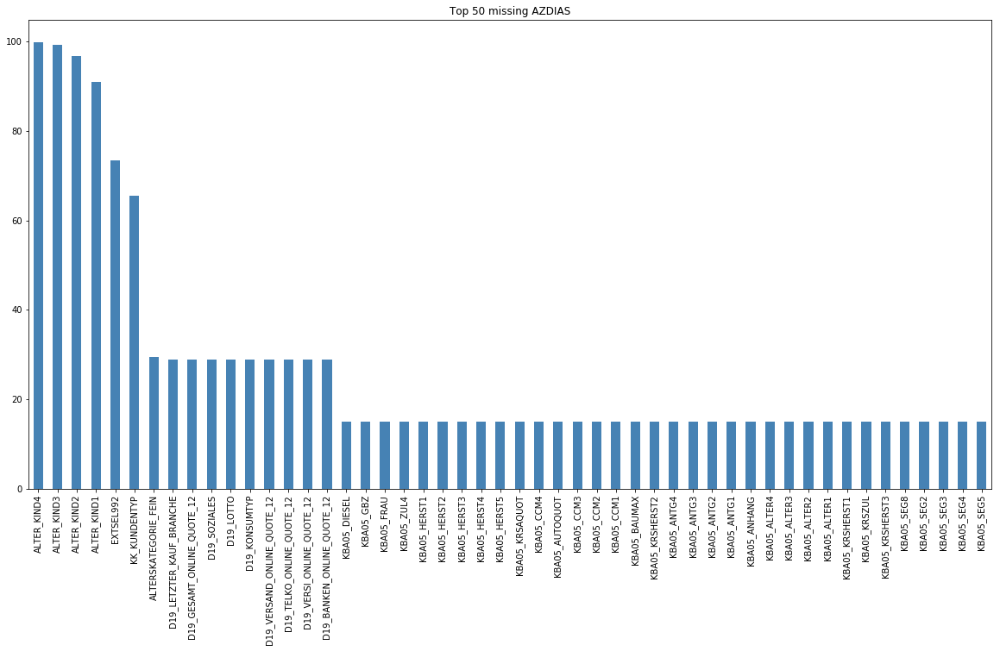

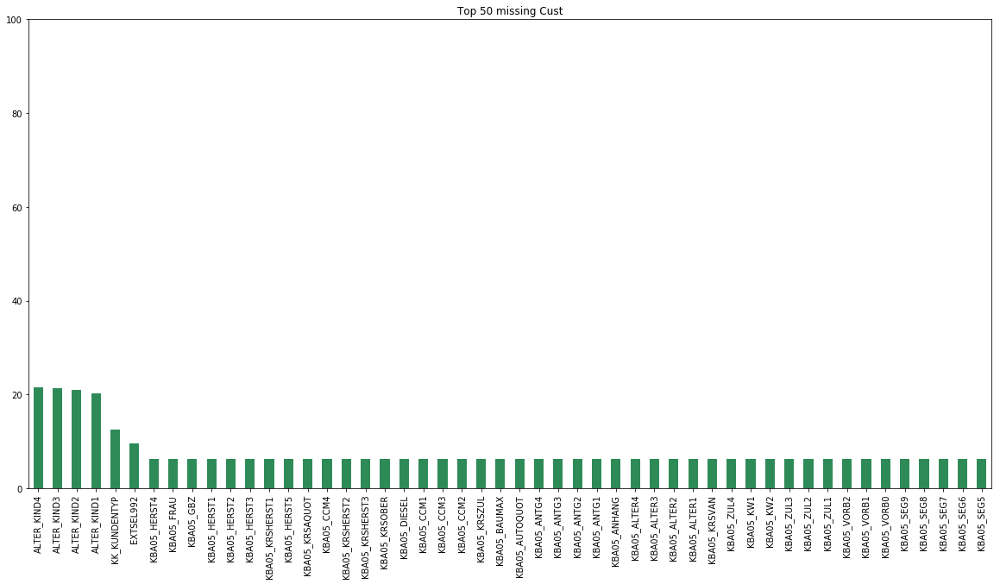

In [23]:

plt.figure(figsize = [20, 10])
top_50_az['Percentage'].plot(kind='bar', color='steelblue')
plt.title('Top 50 missing AZDIAS')
plt.figure(figsize = [20, 10])
top_50_cust['Percentage'].plot(kind='bar',y=100, color='seagreen')
plt.yticks(np.arange(0,120,20))
plt.title('Top 50 missing Cust')

In [24]:
#reevaluate missing after correcting missing vals
def missing_to_nan(df, miss):
    for name in miss.index:
        if name in df.columns:
            df[name] = df[name].replace(miss.loc[name]['missing_vals'], np.nan) 
    return df
missing_to_nan(customers, missing_att_df)


,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,9626,2.0,1.0,10.0,NaN,NaN,NaN,NaN,10.0,1.0,...,3.0,5.0,3.0,2.0,6.0,9.0,7.0,3,1,4
1,9628,NaN,9.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,6.0,6.0,3.0,NaN,9.0,NaN,3,1,4
2,143872,NaN,1.0,6.0,NaN,NaN,NaN,NaN,0.0,1.0,...,4.0,10.0,13.0,11.0,6.0,9.0,2.0,3,2,4
3,143873,1.0,1.0,8.0,NaN,NaN,NaN,NaN,8.0,0.0,...,2.0,6.0,4.0,2.0,NaN,9.0,7.0,1,1,4
4,143874,NaN,1.0,20.0,NaN,NaN,NaN,NaN,14.0,7.0,...,4.0,3.0,5.0,4.0,2.0,9.0,3.0,1,1,3
5,143888,1.0,1.0,11.0,NaN,NaN,NaN,NaN,10.0,1.0,...,4.0,1.0,2.0,1.0,6.0,9.0,1.0,2,1,3
6,143904,2.0,1.0,10.0,NaN,NaN,NaN,NaN,10.0,1.0,...,4.0,3.0,4.0,2.0,6.0,9.0,7.0,1,1,4
7,143910,1.0,1.0,10.0,NaN,NaN,NaN,NaN,9.0,1.0,...,3.0,1.0,2.0,1.0,6.0,9.0,3.0,3,1,4
8,102160,2.0,3.0,5.0,NaN,NaN,NaN,NaN,4.0,74.0,...,NaN,8.0,11.0,9.0,6.0,3.0,4.0,3,2,4
9,102173,1.0,1.0,20.0,NaN,NaN,NaN,NaN,13.0,1.0,...,2.0,3.0,5.0,4.0,2.0,9.0,5.0,1,1,3


In [25]:
#reevaluate missing data
miss_az_after = missing_data(azdias)
miss_cust_after = missing_data(customers)
miss_azr_after = missing_data_row(azdias)


In [25]:
over20_missing_rows_az = miss_azr_after[miss_azr_after['Percentage']>20]
print(over20_missing_rows_az)
#see that 150k rows are missing more then 20% of data

        Total  Percentage
537799    259       70.96
350182    259       70.96
55664     259       70.96
826869    259       70.96
373501    259       70.96
347712    258       70.68
522174    258       70.68
255742    258       70.68
57866     258       70.68
140317    258       70.68
739769    258       70.68
716386    258       70.68
629707    258       70.68
475330    258       70.68
332962    258       70.68
5099      258       70.68
23667     258       70.68
228624    256       70.14
308101    253       69.32
634380    253       69.32
421576    253       69.32
776750    253       69.32
308108    253       69.32
634444    253       69.32
634400    253       69.32
421574    253       69.32
85608     253       69.32
156400    253       69.32
634437    253       69.32
421499    253       69.32
...       ...         ...
414463     74       20.27
200351     74       20.27
210630     74       20.27
51677      74       20.27
450619     74       20.27
112353     74       20.27
221847     7

Text(0.5,1,'Top 50 missing Customer Feats after NaN')

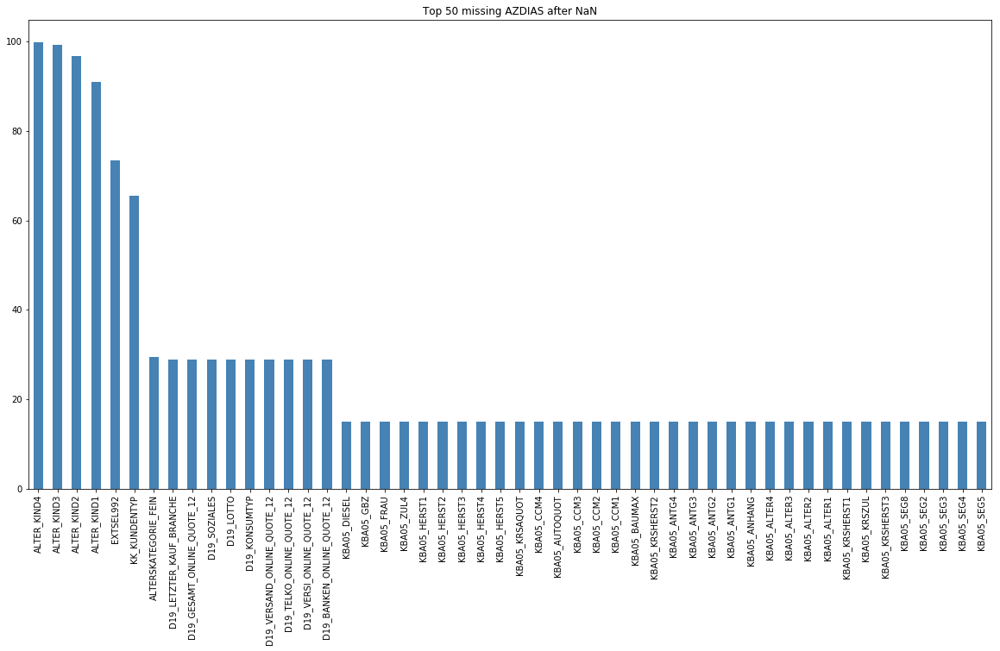

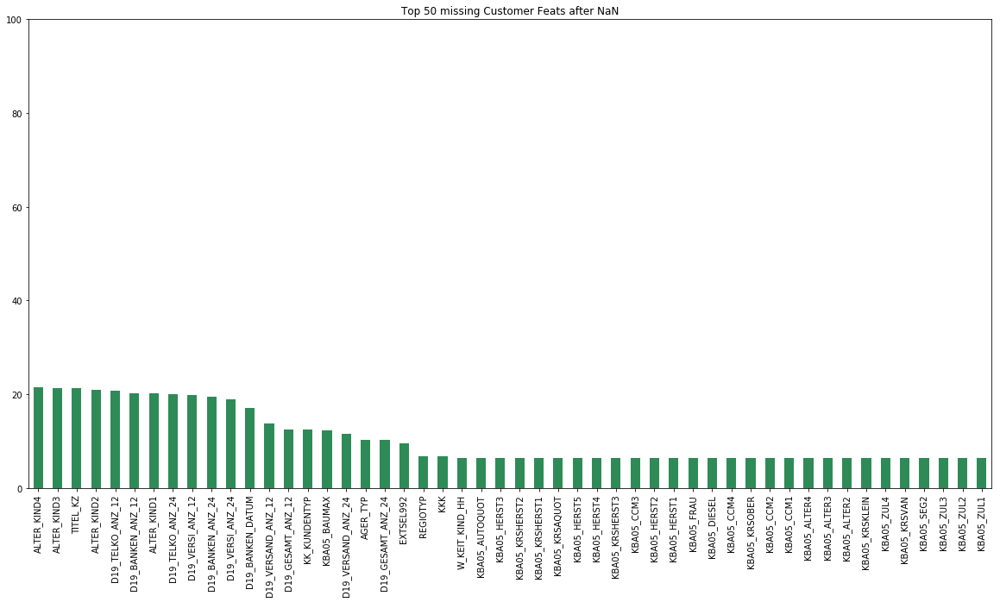

In [26]:
top_50_az_afterNaN = miss_az_after[:50]
plt.figure(figsize = [20, 10])
top_50_az_afterNaN['Percentage'].plot(kind='bar', color='steelblue')
plt.title('Top 50 missing AZDIAS after NaN')

top_50_cust_afterNaN = miss_cust_after[:50]
plt.figure(figsize=[20,10])
top_50_cust_afterNaN['Percentage'].plot(kind='bar', y=100,color='seagreen')
plt.yticks(np.arange(0,120,20))
plt.title('Top 50 missing Customer Feats after NaN')

In [27]:
# Over 20 percent missing data in AZDIAS, CUSTOMERS and in both(Overall)

over20_afterNaN_az=miss_az_after[miss_az_after['Percentage']>20]
over20_afterNaN_cust = miss_cust_after[miss_cust_after['Percentage']>20]
def over_overall(df1, df2):
    arr = df1.index.tolist()
    for i in df2.index:
        if i not in arr:
            arr.append(i)
    return arr

over20_overall = over_overall(over20_afterNaN_az, over20_afterNaN_cust)

In [28]:
print(len(over20_overall))

20


In [29]:
#Over 20 percent in common between AZDIAS and CUSTOMERS dataframe
def in_common_func(df1, df2):
    arr = []
    
    for i in df1.index:
        if i in df2.index:
            arr.append(i)
    return arr

in_common = in_common_func(over20_afterNaN_az, over20_afterNaN_cust)
print(in_common)

['ALTER_KIND4', 'ALTER_KIND3', 'ALTER_KIND2', 'ALTER_KIND1']


In [56]:
#Correlation between features on AZDIAS and CUSTOMERS
 
with active_session():
    c_corr = customers.corr()
    az_corr = azdias.corr()

In [57]:
#Correlation between overall features with 20% or more missing values on AZDIAS dataframe. Purpose of this study is to
#identify which features to drop without causing OVB (Ommited Variable Bias)
strong_corr_az = az_corr.loc[over20_overall]

print(strong_corr_az)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  This is separate from the ipykernel package so we can avoid doing imports until


                             AGER_TYP  AKT_DAT_KL  ALTER_HH  ALTER_KIND1  \
ALTER_KIND4                  0.007744    0.026464  0.008581     0.477439   
ALTER_KIND3                 -0.006071    0.011188 -0.053774     0.610869   
ALTER_KIND2                  0.003560   -0.006282 -0.071733     0.781195   
ALTER_KIND1                  0.026300    0.031251 -0.068980     1.000000   
EXTSEL992                    0.172257   -0.169208  0.004846    -0.008019   
KK_KUNDENTYP                 0.078280    0.020464 -0.127906    -0.007003   
ALTERSKATEGORIE_FEIN        -0.390886    0.306277  0.518291    -0.130236   
D19_LETZTER_KAUF_BRANCHE          NaN         NaN       NaN          NaN   
D19_GESAMT_ONLINE_QUOTE_12  -0.080315   -0.194122  0.228642    -0.017212   
D19_SOZIALES                 0.168882   -0.153368 -0.007574     0.076138   
D19_LOTTO                    0.132370   -0.145898  0.020901     0.095158   
D19_KONSUMTYP               -0.023384    0.298308 -0.225326     0.036599   
D19_VERSAND_

In [58]:
top_cust_corr = strong_corr_az.abs().unstack().sort_values(kind="quicksort", ascending=False).drop_duplicates()
top_cust_corr1 = pd.DataFrame(top_cust_corr, columns = ['Corr'])


In [59]:
over_80=top_cust_corr1[top_cust_corr1['Corr']>0.6]
print(over_80.index)

MultiIndex(levels=[['AGER_TYP', 'AKT_DAT_KL', 'ALTER_HH', 'ALTER_KIND1', 'ALTER_KIND2', 'ALTER_KIND3', 'ALTER_KIND4', 'ALTERSKATEGORIE_FEIN', 'ANZ_HAUSHALTE_AKTIV', 'ANZ_HH_TITEL', 'ANZ_KINDER', 'ANZ_PERSONEN', 'ANZ_STATISTISCHE_HAUSHALTE', 'ANZ_TITEL', 'ARBEIT', 'BALLRAUM', 'CJT_GESAMTTYP', 'CJT_KATALOGNUTZER', 'CJT_TYP_1', 'CJT_TYP_2', 'CJT_TYP_3', 'CJT_TYP_4', 'CJT_TYP_5', 'CJT_TYP_6', 'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24', 'D19_BANKEN_DATUM', 'D19_BANKEN_DIREKT', 'D19_BANKEN_GROSS', 'D19_BANKEN_LOKAL', 'D19_BANKEN_OFFLINE_DATUM', 'D19_BANKEN_ONLINE_DATUM', 'D19_BANKEN_ONLINE_QUOTE_12', 'D19_BANKEN_REST', 'D19_BEKLEIDUNG_GEH', 'D19_BEKLEIDUNG_REST', 'D19_BILDUNG', 'D19_BIO_OEKO', 'D19_BUCH_CD', 'D19_DIGIT_SERV', 'D19_DROGERIEARTIKEL', 'D19_ENERGIE', 'D19_FREIZEIT', 'D19_GARTEN', 'D19_GESAMT_ANZ_12', 'D19_GESAMT_ANZ_24', 'D19_GESAMT_DATUM', 'D19_GESAMT_OFFLINE_DATUM', 'D19_GESAMT_ONLINE_DATUM', 'D19_GESAMT_ONLINE_QUOTE_12', 'D19_HANDWERK', 'D19_HAUS_DEKO', 'D19_KINDERARTIKEL', 'D1

In [29]:
clean_az = azdias.drop(over20_overall, axis=1)
clean_cust = customers.drop(over20_overall, axis=1)

In [30]:
clean_az.head()
clean_cust.head()

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,9626,2.0,1.0,10.0,1.0,0.0,0.0,2.0,1.0,0.0,...,3.0,5.0,3.0,2.0,6.0,9.0,7.0,3,1,4
1,9628,NaN,9.0,11.0,NaN,NaN,0.0,3.0,NaN,0.0,...,NaN,6.0,6.0,3.0,NaN,9.0,NaN,3,1,4
2,143872,NaN,1.0,6.0,1.0,0.0,0.0,1.0,1.0,0.0,...,4.0,10.0,13.0,11.0,6.0,9.0,2.0,3,2,4
3,143873,1.0,1.0,8.0,0.0,NaN,0.0,0.0,1.0,0.0,...,2.0,6.0,4.0,2.0,NaN,9.0,7.0,1,1,4
4,143874,NaN,1.0,20.0,7.0,0.0,0.0,4.0,7.0,0.0,...,4.0,3.0,5.0,4.0,2.0,9.0,3.0,1,1,3


In [31]:
#analysis after clean-up
clean_az_col = missing_data(clean_az)
clean_cust_col = missing_data(clean_cust)


Text(0.5,1,'Top 50 missing CUSTOMERS feat. after Clean')

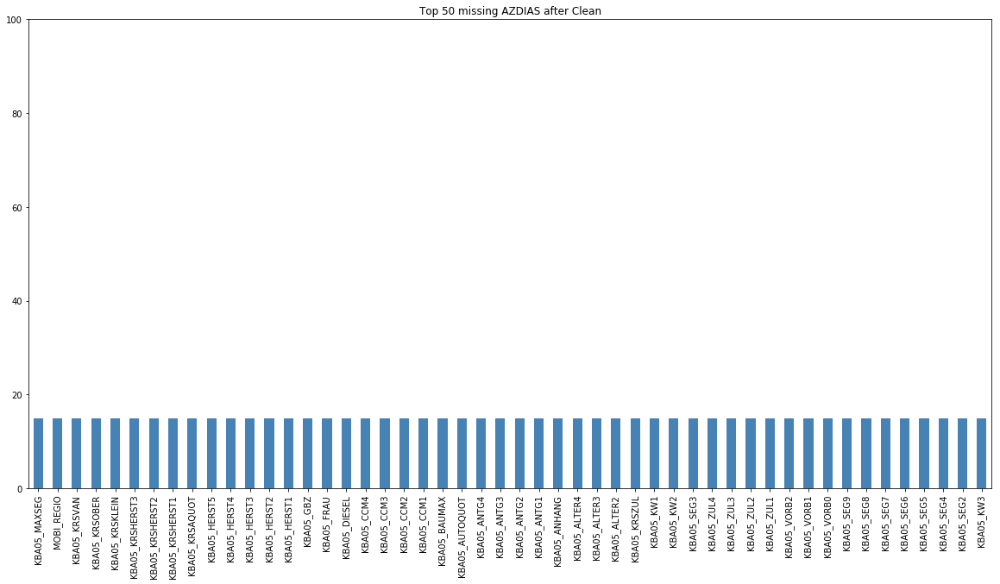

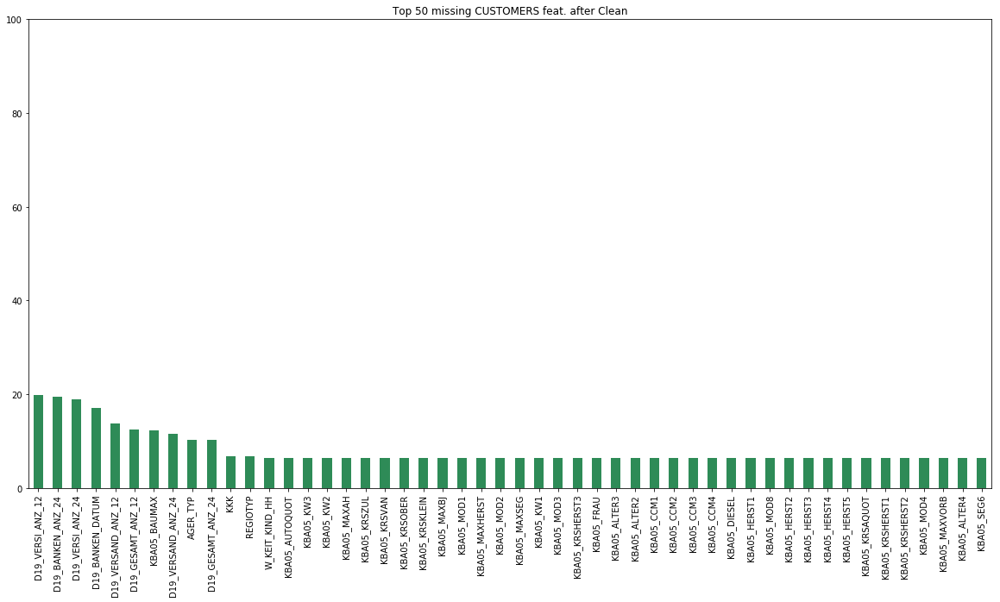

In [32]:
top_50_az_afterClean = clean_az_col[:50]
plt.figure(figsize = [20, 10])
top_50_az_afterClean['Percentage'].plot(kind='bar', y=100, color='steelblue')
plt.yticks(np.arange(0,120,20))
plt.title('Top 50 missing AZDIAS after Clean')

top_50_cust_afterClean = clean_cust_col[:50]
plt.figure(figsize = [20, 10])
top_50_cust_afterClean['Percentage'].plot(kind='bar', y=100, color='seagreen')
plt.yticks(np.arange(0,120,20))
plt.title('Top 50 missing CUSTOMERS feat. after Clean')


In [65]:
clean_az_row = missing_data_row(clean_az)
clean_cust_row = missing_data_row(clean_cust)

In [66]:
(clean_az.shape, clean_cust.shape)


((891221, 345), (191652, 346))

In [67]:
#Show rows with over 20% missing data. Will delete them

In [68]:
clean_az_row = clean_az_row[clean_az_row['Percentage']>21]
clean_cust_row = clean_cust_row[clean_cust_row['Percentage']>21]

In [69]:
clean_az_row = clean_az_row.index.values
clean_cust_row = clean_cust_row.index.values

clean_az.drop(clean_az_row, axis=0, inplace=True)
clean_cust.drop(clean_cust_row, axis=0, inplace=True)

In [70]:
with active_session():
    
    complete_clean_az = missing_data(clean_az)
    complete_clean_cust = missing_data(clean_cust)

Text(0.5,1,'Top 50 missing CUSTOMERS Feats. after complete clean Rows and Cols')

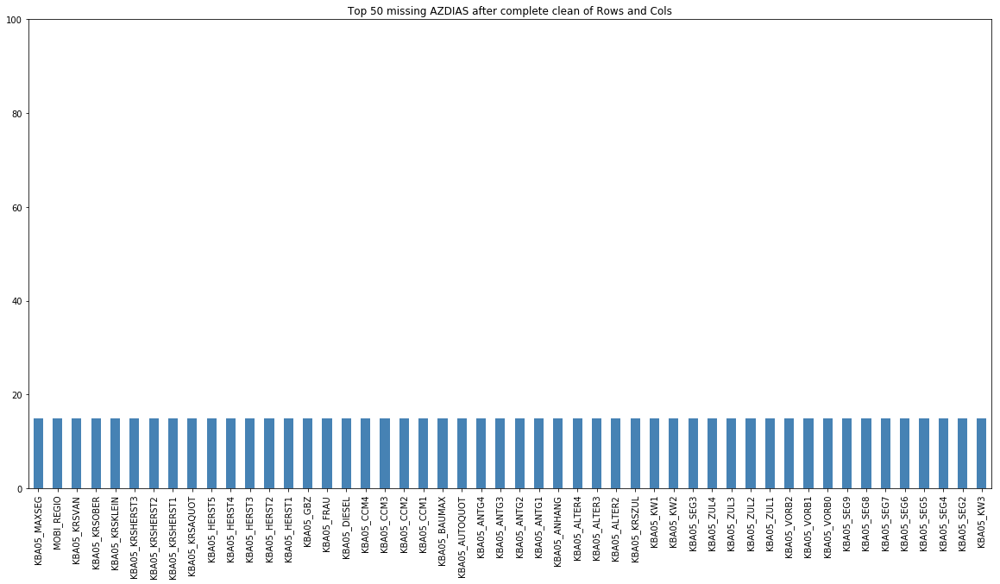

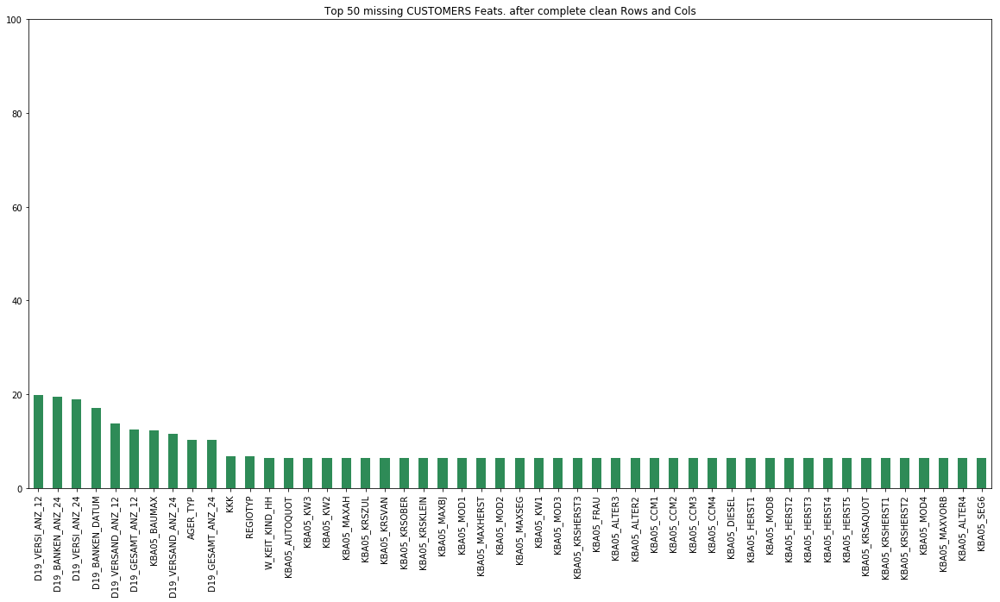

In [71]:
top_50_az_afterClean = complete_clean_az[:50]
plt.figure(figsize = [20, 10])
top_50_az_afterClean['Percentage'].plot(kind='bar', y=100, color='steelblue')
plt.yticks(np.arange(0,120,20))
plt.title('Top 50 missing AZDIAS after complete clean of Rows and Cols')

top_50_cust_afterClean = clean_cust_col[:50]
plt.figure(figsize = [20, 10])
top_50_cust_afterClean['Percentage'].plot(kind='bar', y=100, color='seagreen')
plt.yticks(np.arange(0,120,20))
plt.title('Top 50 missing CUSTOMERS Feats. after complete clean Rows and Cols')


In [72]:
#After clean we maintain over 90% of original data and average top 50 missing data by features drops to 5-7%

In [73]:
# After data has been cleaned, i will Impute and scale reamining missing values. By deleting majority of missing values
#will reduce error by aproximation of data.


In [33]:
#create sample to do PCA
with active_session():
        
    def sampler(df):
        sample_df = df.sample(frac=0.2, random_state=42)
        return sample_df
    sample_az = sampler(clean_az)

In [34]:
# Creating decade_dict and decade_list to be used in make_decade function.
decade_dict = {1: [1, 2], 2: [3, 4], 3: [5, 6, 7], 4: [8, 9], 5: [10, 11, 12, 13], 6:[14, 15]}
#decade_dict.items()
decade_dict.values()
decade_list = []
for dd in decade_dict.values():
    for i in dd:
        decade_list.append(i)
        
def make_decade(x):
    
    if pd.isnull(x):
        return np.nan
    else:
        for key, array in decade_dict.items():
            if x in array:
                return key
            elif x not in decade_list:
                print('There is some error while mapping decade. Please check.')

    
def make_movement(x):
    if pd.isnull(x):
        return np.nan
    elif x in (2,4,6,7,9,11,13,15):
        return 0        
    elif x in (1,3,5,8,10,12,14):
        return 1
    else:
        print('There is some error while mapping movement. Please check.')

In [35]:
sample_az['PRAEGENDE_JUGENDJAHRE_dec'] = sample_az['PRAEGENDE_JUGENDJAHRE'].apply(make_decade)
sample_az['PRAEGENDE_JUGENDJAHRE_mov'] = sample_az['PRAEGENDE_JUGENDJAHRE'].apply(make_movement)

There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please check.
There is some error while mapping decade. Please

In [36]:
def make_wealth(x):
#    print(x)
#    print(type(x))
    if pd.isnull(x):
        return np.nan 
    elif int(x) // 10 == 1:
        return 1
    elif int(x) // 10 == 2:
        return 2
    elif int(x) // 10 == 3:
        return 3
    elif int(x) // 10 == 4:
        return 4
    elif int(x) // 10 == 5:
        return 5
    
def make_life_stage(x):
    if pd.isnull(x):
        return np.nan 
    elif int(x) % 10 == 1:
        return 1
    elif int(x) % 10 == 2:
        return 2
    elif int(x) % 10 == 3:
        return 3
    elif int(x) % 10 == 4:
        return 4
    elif int(x) % 10 == 5:
        return 5

In [37]:
sample_az['CAMEO_INTL_2015'] = sample_az['CAMEO_INTL_2015'].replace('XX', np.nan)
sample_az['CAMEO_INTL_2015_wealth'] = sample_az['CAMEO_INTL_2015'].apply(make_wealth)
sample_az['CAMEO_INTL_2015_life_stage'] = sample_az['CAMEO_INTL_2015'].apply(make_life_stage)
sample_az['OST_WEST_KZ'].replace(['W','O'], [1, 0], inplace=True)

In [38]:
sample_az.drop(['LP_LEBENSPHASE_FEIN','LP_LEBENSPHASE_GROB','WOHNLAGE','PLZ8_BAUMAX','PRAEGENDE_JUGENDJAHRE','CAMEO_INTL_2015'], axis=1)

,AGER_TYP,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,...,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB,PRAEGENDE_JUGENDJAHRE_dec,PRAEGENDE_JUGENDJAHRE_mov,CAMEO_INTL_2015_wealth,CAMEO_INTL_2015_life_stage
848815,1,1.0,12.0,6.0,1.0,0.0,0.0,4.0,0.0,3.0,...,10.0,NaN,9.0,3,2,3,3.0,1.0,5.0,1.0
299816,-1,1.0,0.0,1.0,0.0,0.0,2.0,1.0,0.0,3.0,...,3.0,3.0,8.0,1,2,2,6.0,1.0,2.0,4.0
570748,-1,9.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,3.0,...,6.0,6.0,9.0,1,1,1,6.0,0.0,2.0,4.0
354371,-1,9.0,16.0,1.0,0.0,0.0,3.0,1.0,0.0,4.0,...,4.0,2.0,9.0,1,1,3,5.0,1.0,2.0,3.0
329018,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3,2,3,NaN,NaN,NaN,NaN
49016,1,9.0,10.0,1.0,0.0,0.0,1.0,1.0,0.0,4.0,...,7.0,6.0,8.0,1,1,4,2.0,0.0,5.0,1.0
454415,-1,9.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,...,10.0,3.0,7.0,3,2,3,4.0,0.0,1.0,3.0
361475,1,1.0,11.0,19.0,0.0,0.0,1.0,19.0,0.0,4.0,...,2.0,6.0,8.0,3,2,4,3.0,1.0,5.0,5.0
148484,2,9.0,4.0,14.0,0.0,0.0,1.0,15.0,0.0,2.0,...,10.0,6.0,9.0,3,2,4,1.0,1.0,2.0,4.0
363393,-1,9.0,0.0,5.0,0.0,0.0,2.0,2.0,0.0,4.0,...,6.0,3.0,9.0,4,1,2,5.0,1.0,1.0,3.0


In [39]:
sample_az[['CAMEO_DEU_2015', 'CAMEO_DEUG_2015', 'EINGEFUEGT_AM']]

,CAMEO_DEU_2015,CAMEO_DEUG_2015,EINGEFUEGT_AM
848815,9B,9,1992-02-12 00:00:00
299816,4C,4,1992-02-10 00:00:00
570748,4C,4,1994-08-30 00:00:00
354371,3A,3,2005-10-11 00:00:00
329018,NaN,NaN,NaN
49016,9D,9,1992-02-12 00:00:00
454415,2B,2,1992-02-10 00:00:00
361475,8D,8,1992-02-12 00:00:00
148484,4D,4,1992-02-10 00:00:00
363393,2B,2,1992-02-10 00:00:00


In [40]:
sample_az.drop(['CAMEO_DEUG_2015', 'CAMEO_DEU_2015', 'EINGEFUEGT_AM'], axis=1, inplace=True)

In [41]:
with active_session():
    
    imputer = Imputer(missing_values='NaN',strategy='most_frequent',axis=0)
    sample_az_imputed = imputer.fit_transform(sample_az)
    sample_az_imputed = pd.DataFrame(sample_az_imputed)

In [42]:
 with active_session():
    scaler = StandardScaler()
    sample_az_scaled = scaler.fit_transform(sample_az_imputed)
    sample_az_scaled = pd.DataFrame(sample_az_scaled, columns=list(sample_az.columns.values))

## Part 1: Customer Segmentation Report

The main bulk of your analysis will come in this part of the project. Here, you should use unsupervised learning techniques to describe the relationship between the demographics of the company's existing customers and the general population of Germany. By the end of this part, you should be able to describe parts of the general population that are more likely to be part of the mail-order company's main customer base, and which parts of the general population are less so.

In [87]:
print(sample_az)

        AGER_TYP  AKT_DAT_KL  ALTER_HH  ANZ_HAUSHALTE_AKTIV  ANZ_HH_TITEL  \
848815         1         1.0      12.0                  6.0           1.0   
299816        -1         1.0       0.0                  1.0           0.0   
570748        -1         9.0       0.0                  1.0           0.0   
354371        -1         9.0      16.0                  1.0           0.0   
329018        -1         NaN       NaN                  NaN           NaN   
49016          1         9.0      10.0                  1.0           0.0   
454415        -1         9.0       0.0                  1.0           0.0   
361475         1         1.0      11.0                 19.0           0.0   
148484         2         9.0       4.0                 14.0           0.0   
363393        -1         9.0       0.0                  5.0           0.0   
476938         1         1.0       0.0                  1.0           0.0   
835010        -1         1.0      14.0                  1.0           0.0   

In [88]:
sample_az_scaled.head()

,AGER_TYP,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,...,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB,PRAEGENDE_JUGENDJAHRE_dec,PRAEGENDE_JUGENDJAHRE_mov,CAMEO_INTL_2015_wealth,CAMEO_INTL_2015_life_stage
0,1.133486,-0.866902,0.256825,-0.098691,3.140562,-0.294069,-1.492128,-0.208826,-0.058432,-0.260588,...,0.924621,0.536518,0.025773,-0.265134,0.957630,0.210117,-1.043925,0.495378,1.040227,-1.092151
1,-0.535180,-0.866902,-1.260668,-0.432040,-0.118671,-0.294069,0.297717,-0.427336,-0.058432,-0.260588,...,-0.602432,0.000859,-0.507354,-1.743903,0.957630,-0.724248,0.991146,0.495378,-0.982944,0.881570
2,-0.535180,1.348352,-1.260668,-0.432040,-0.118671,-0.294069,-0.597206,-0.427336,-0.058432,-0.260588,...,0.924621,0.536518,1.625154,-1.743903,-1.044244,-1.658613,0.991146,-2.018662,-0.982944,0.881570
3,-0.535180,1.348352,0.762655,-0.432040,-0.118671,-0.294069,1.192639,-0.427336,-0.058432,0.759491,...,-1.111449,0.536518,-0.507354,-1.743903,-1.044244,0.210117,0.312789,0.495378,-0.982944,0.223663
4,-0.535180,-0.866902,-1.260668,-0.432040,-0.118671,-0.294069,-0.597206,-0.427336,-0.058432,0.759491,...,0.924621,0.536518,-0.507354,-0.265134,0.957630,0.210117,0.991146,0.495378,1.040227,-1.092151


In [43]:
from sklearn.decomposition import PCA
import numpy as np

In [44]:
pca = PCA()
pca_fit = pca.fit(sample_az_scaled)

In [45]:
#udacity given function
def scree_plot(pca): 
    '''
    Creates a scree plot associated with the principal components 
    
    INPUT: pca - the result of instantian of PCA in scikit learn
            
    RETURN: None
    '''
    num_components= len(pca.explained_variance_ratio_)
    idx = np.arange(num_components)
    vals = pca.explained_variance_ratio_
 
    plt.figure(figsize=(15, 10))
    ax = plt.subplot(111)
    cumvals = np.cumsum(vals)
    ax.bar(idx, vals)
    ax.plot(idx, cumvals)
    for i in range(num_components):
        if(i%20 == 0 or i<6):
            ax.annotate(r"%s%%" % ((str(vals[i]*100)[:4])), (idx[i]+0.2, vals[i]), va="bottom", ha="center", fontsize=8)
    
    ax.xaxis.set_tick_params(width=0, gridOn=True)
    ax.yaxis.set_tick_params(width=2, length=12, gridOn=True)
 
    ax.set_xlabel("Principal Component")
    ax.set_ylabel("Variance Explained (%)")
    plt.title('Explained Variance Per Principal Component')

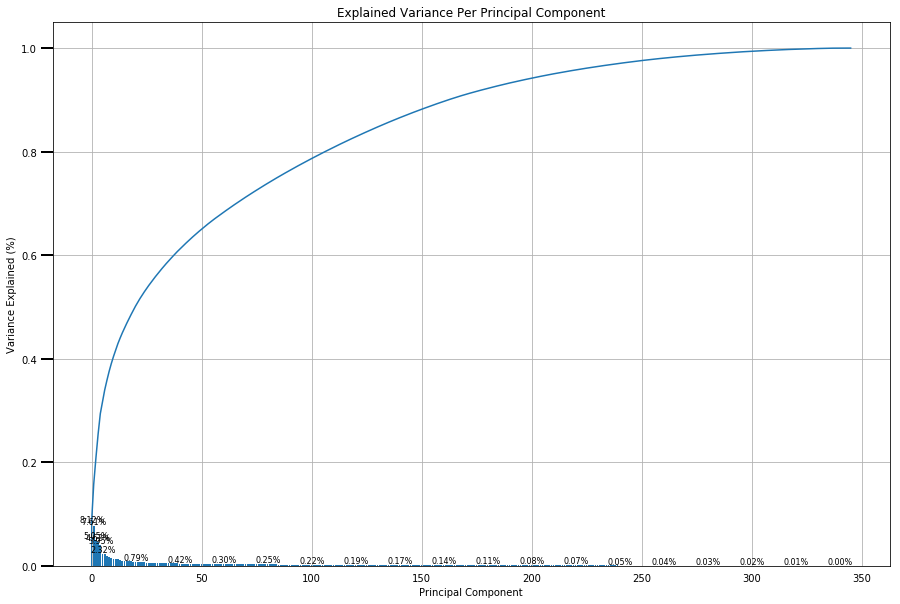

In [46]:
scree_plot(pca)

In [47]:
# Define plot function to check out cumulative variance explained by principal components.

def plot_cum_var(pca):
    '''
    Creates a plot associated with the principal components 
    
    INPUT: pca - the result of instantian of PCA in scikit learn
            
    OUTPUT:
            None
    '''
    num_components=len(pca.explained_variance_ratio_)
    ind = np.arange(num_components)
    vals = pca.explained_variance_ratio_
 
    plt.figure(figsize=(10, 6))
    ax = plt.subplot(111)
    cumvals = np.cumsum(vals)
    #ax.bar(ind, vals)
    ax.plot(ind, cumvals)
    
    ax.grid()
    ax.set_axisbelow(True)
    ax.grid(linewidth='0.5', alpha=0.5)
    
    cumval_ind_hv1 = []
    cumval_ind_hv2 = []
    cumval_ind_hv3 = []
    cumval_ind_hv4 = []
    cumval_ind_hv5 = []
    cumval_ind_hv6 = []
    cumval_ind_hv7 = []
    for i in enumerate(cumvals):
        if i[1] > 0.3 and i[1] < 0.4:
            cumval_ind_hv1.append(i)
        elif i[1] > 0.4 and i[1] < 0.5:
            cumval_ind_hv2.append(i)
        elif i[1] > 0.5 and i[1] < 0.6:
            cumval_ind_hv3.append(i)
        elif i[1] > 0.6 and i[1] < 0.7:
            cumval_ind_hv4.append(i)
        elif i[1] > 0.7 and i[1] < 0.8:
            cumval_ind_hv5.append(i)
        elif i[1] > 0.8 and i[1] < 0.9:
            cumval_ind_hv6.append(i)    
        elif i[1] > 0.9:
            cumval_ind_hv7.append(i)
            
    #print(cumval_ind_hv1[0][0])
    #print(cumval_ind_hv2[0][0])
    #print(cumval_ind_hv3[0][0])
    #print(cumval_ind_hv4[0][0])
    
    # Plotting horizontal and vertical at points with cumulative variance of 30%, 50%, 60% and 80%.

    plt.hlines(y=0.3, xmin=0, xmax=cumval_ind_hv1[0][0], color='red', linestyles='dashed',zorder=1)
    plt.vlines(x=cumval_ind_hv1[0][0], ymin=0, ymax=0.3, color='red', linestyles='dashed',zorder=2)
    plt.hlines(y=0.4, xmin=0, xmax=cumval_ind_hv2[0][0], color='red', linestyles='dashed',zorder=3)
    plt.vlines(x=cumval_ind_hv2[0][0], ymin=0, ymax=0.4, color='red', linestyles='dashed',zorder=4)
    plt.hlines(y=0.5, xmin=0, xmax=cumval_ind_hv3[0][0], color='red', linestyles='dashed',zorder=5)
    plt.vlines(x=cumval_ind_hv3[0][0], ymin=0, ymax=0.5, color='red', linestyles='dashed',zorder=6)
    plt.hlines(y=0.6, xmin=0, xmax=cumval_ind_hv4[0][0], color='red', linestyles='dashed',zorder=7)
    plt.vlines(x=cumval_ind_hv4[0][0], ymin=0, ymax=0.6, color='red', linestyles='dashed',zorder=8)
    plt.hlines(y=0.7, xmin=0, xmax=cumval_ind_hv5[0][0], color='red', linestyles='dashed',zorder=9)
    plt.vlines(x=cumval_ind_hv5[0][0], ymin=0, ymax=0.7, color='red', linestyles='dashed',zorder=10)
    plt.hlines(y=0.8, xmin=0, xmax=cumval_ind_hv6[0][0], color='red', linestyles='dashed',zorder=11)
    plt.vlines(x=cumval_ind_hv6[0][0], ymin=0, ymax=0.8, color='red', linestyles='dashed',zorder=12) 
    plt.hlines(y=0.9, xmin=0, xmax=cumval_ind_hv7[0][0], color='red', linestyles='-',zorder=13)
    plt.vlines(x=cumval_ind_hv7[0][0], ymin=0, ymax=0.9, color='red', linestyles='-',zorder=14)
    
    # Plotting number of components for cumulative variance of 30%, 50%, 60% and 80%.
    for i,v in [cumval_ind_hv1[0], cumval_ind_hv2[0], cumval_ind_hv3[0],\
                cumval_ind_hv4[0], cumval_ind_hv5[0], cumval_ind_hv6[0], cumval_ind_hv7[0]]:
        ax.annotate(r"%s" % ((str(i+1))), (i+0.2, np.round(v, 2)), va="bottom", ha="center", fontsize=12)


 
    ax.xaxis.set_tick_params(width=0)
    ax.yaxis.set_tick_params(width=2, length=12)
 
    ax.set_xlabel("Principal Component")
    ax.set_ylabel("Variance Explained (%)")
    plt.title('Cumulative Variance of Principal Components')

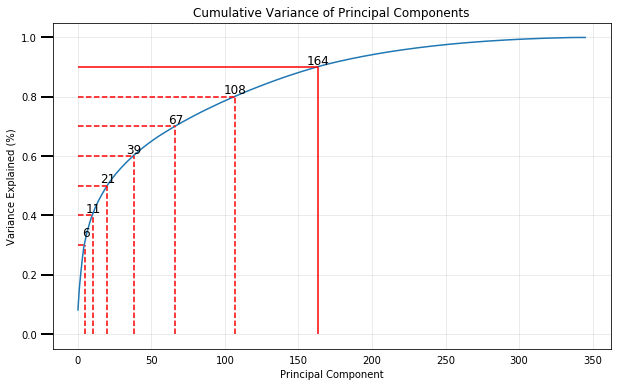

In [48]:
plot_cum_var(pca)

I chose to retain 164 components since it provides more than 90% of variance, which is a pretty high value. It is interesting mentioning that just around 5 principal components would provide about 20% of variance, and retaining just 20 would provide almost 50%. However, 200 were chosen since we are looking to keep the highest variance possible in order not to lose much precision in the results.

In [49]:
#reapply PCA to take down to 164 features
pca = PCA(n_components=164)
sample_az_pca = pca.fit_transform(sample_az_scaled)



In [50]:
from sklearn.cluster import KMeans
centers = []
scores = []

# REVER ESTA FUNCAO !!!!!!!!!!!!!!!!!


for cluster in range(2, 15, 1):

    kmean = KMeans(cluster)
    model = kmean.fit(sample_az_pca)
    centers.append(cluster)
    scores.append(np.abs(model.score(sample_az_pca)))

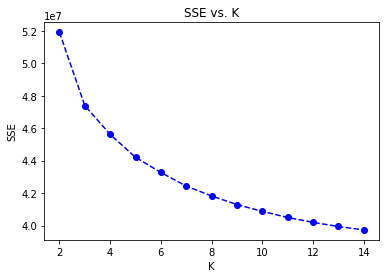

In [51]:
plt.plot(centers, scores, linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('SSE');
plt.title('SSE vs. K');

In [62]:
kmeans = KMeans(6).fit(sample_az_pca)
sample_az_pred = kmeans.predict(sample_az_pca)

In [ ]:
(sample_az.shape,
clean_cust.shape)
diff = [c for c in sample_az.columns.values.tolist() if c not in clean_cust.columns.values.tolist()]
print(diff)

In [63]:
clean_cust['PRAEGENDE_JUGENDJAHRE_dec'] = clean_cust['PRAEGENDE_JUGENDJAHRE'].apply(make_decade)
clean_cust['PRAEGENDE_JUGENDJAHRE_mov'] = clean_cust['PRAEGENDE_JUGENDJAHRE'].apply(make_movement)
#clean_cust['PRAEGENDE_JUGENDJAHRE'] =  customers['PRAEGENDE_JUGENDJAHRE']

In [64]:
#PREPARE CUSTOMER DATA
clean_cust['PRAEGENDE_JUGENDJAHRE_dec'] = clean_cust['PRAEGENDE_JUGENDJAHRE'].apply(make_decade)
clean_cust['PRAEGENDE_JUGENDJAHRE_mov'] = clean_cust['PRAEGENDE_JUGENDJAHRE'].apply(make_movement)
clean_cust['CAMEO_INTL_2015'] = clean_cust['CAMEO_INTL_2015'].replace('XX', np.nan)
clean_cust['OST_WEST_KZ'].replace(['W','O'], [1, 0], inplace=True)
clean_cust['CAMEO_INTL_2015_wealth'] = clean_cust['CAMEO_INTL_2015'].apply(make_wealth)
clean_cust['CAMEO_INTL_2015_life_stage'] = clean_cust['CAMEO_INTL_2015'].apply(make_life_stage)

clean_cust.drop(['LNR'], axis=1, inplace=True)
clean_cust.drop(['CAMEO_DEUG_2015', 'CAMEO_DEU_2015', 'EINGEFUEGT_AM','PRAEGENDE_JUGENDJAHRE','CAMEO_INTL_2015'], axis=1, inplace=True)


In [114]:
clean_cust.drop(['LNR'], axis=1, inplace=True)


In [115]:
cust_imputed = imputer.fit_transform(clean_cust)
cust_imputed = pd.DataFrame(cust_imputed)

cust_scaled = scaler.fit_transform(cust_imputed)
cust_scaled = pd.DataFrame(cust_scaled, columns=list(clean_cust.columns.values))

In [116]:
cust_scaled

,AGER_TYP,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,...,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB,PRAEGENDE_JUGENDJAHRE_dec,PRAEGENDE_JUGENDJAHRE_mov,CAMEO_INTL_2015_wealth,CAMEO_INTL_2015_life_stage
0,0.386095,-0.325074,0.192466,-0.235979,-0.105218,-0.238379,-0.166805,-0.222434,-0.116283,-2.144783,...,0.692675,0.263604,1.893824,0.362174,-0.776965,0.864527,-0.540031,-1.312832,-1.167712,-0.452014
1,0.386095,4.271391,0.329163,-0.235979,-0.105218,-0.238379,0.656067,-0.222434,-0.116283,0.147901,...,0.692675,0.263604,-0.292251,0.362174,-0.776965,0.864527,-0.540031,0.761712,-0.357262,0.393134
2,0.386095,-0.325074,-0.354319,-0.235979,-0.105218,-0.238379,-0.989677,-0.222434,-0.116283,0.147901,...,0.692675,0.263604,-0.838770,0.362174,1.287059,0.864527,-0.540031,-1.312832,0.453187,0.393134
3,-1.419299,-0.325074,-0.080926,-0.316443,-0.105218,-0.238379,-1.812549,-0.222434,-0.116283,-2.144783,...,0.692675,0.263604,1.893824,-1.349447,-0.776965,0.864527,-1.355862,0.761712,-0.357262,0.393134
4,0.386095,-0.325074,1.559431,0.246806,-0.105218,-0.238379,1.478939,0.265169,-0.116283,0.147901,...,-1.561293,0.263604,-0.292251,-1.349447,-0.776965,-0.056071,1.091632,0.761712,1.263637,-2.142311
5,-1.419299,-0.325074,0.329163,-0.235979,-0.105218,-0.238379,-0.166805,-0.222434,-0.116283,0.147901,...,0.692675,0.263604,-1.385289,-0.493637,-0.776965,-0.056071,-0.540031,-1.312832,0.453187,0.393134
6,0.386095,-0.325074,0.192466,-0.235979,-0.105218,-0.238379,-0.166805,-0.222434,-0.116283,-0.998441,...,0.692675,0.263604,1.893824,-1.349447,-0.776965,0.864527,-0.540031,-1.312832,-0.357262,-0.452014
7,-1.419299,-0.325074,0.192466,-0.235979,-0.105218,-0.238379,-0.166805,-0.222434,-0.116283,0.147901,...,0.692675,0.263604,-0.292251,0.362174,-0.776965,0.864527,-0.540031,-1.312832,-1.167712,1.238283
8,0.386095,0.824042,-0.491016,5.637905,4.182052,-0.238379,-0.989677,6.360213,-0.116283,0.147901,...,0.692675,-5.645663,0.254268,0.362174,1.287059,0.864527,-1.355862,0.761712,2.074087,1.238283
9,-1.419299,-0.325074,1.559431,-0.235979,-0.105218,-0.238379,0.656067,-0.222434,-0.116283,0.147901,...,-1.561293,0.263604,0.800786,-1.349447,-0.776965,-0.056071,1.091632,-1.312832,-1.167712,1.238283


In [118]:
#depois do resultado, pode deletar se quiser.
cust_pca1 = pca.fit_transform(cust_scaled)
#cust_pca_fit = cust_pca.fit(cust_scaled)


In [124]:
cust_pca = PCA(n_components = 164)
cust_pca_fit = cust_pca.fit_transform(cust_scaled)

In [68]:
cust_kmeans = KMeans(6).fit(cust_pca_fit)
cust_pred = cust_kmeans.predict(cust_pca_fit)

In [69]:
counts_cluster_gen = pd.Series(sample_az_pred).value_counts().sort_index()
counts_cluster_gen.index = [1,2,3,4,5,6]

prop_cluster_gen = []
for value in counts_cluster_gen:
    prop = value / len(sample_az_pred)
    prop_cluster_gen.append(prop)

prop_cluster_general = pd.Series(prop_cluster_gen)
prop_cluster_general.index = [1,2,3,4,5,6]

In [71]:
counts_cluster_cust = pd.Series(cust_pred).value_counts().sort_index()
counts_cluster_cust.index = [1,2,3,4,5,6]

prop_cluster_cust = []
for value in counts_cluster_cust:
    prop = value / len(cust_pred)
    prop_cluster_cust.append(prop)

prop_cluster_customers = pd.Series(prop_cluster_cust)
prop_cluster_customers.index = [1,2,3,4,5,6]

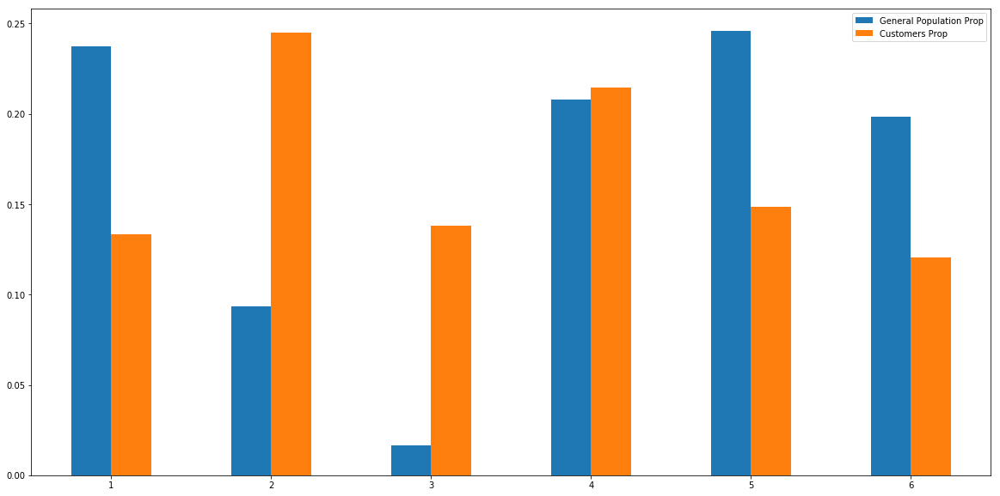

In [72]:
# Compare the proportion of data in each cluster for the customer data to the
# proportion of data in each cluster for the general population.

prop = pd.DataFrame({'General Population Prop': prop_cluster_general,
                     'Customers Prop': prop_cluster_customers})
ax = prop.plot.bar(rot=0, figsize=(20, 10))

In [125]:
over = scaler.inverse_transform(cust_pca.inverse_transform(cust_pca_fit[np.where(cust_pred==4)])).round()
df_under = pd.DataFrame(data=over, columns=clean_cust.columns)
df_under.head()


,AGER_TYP,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,...,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB,PRAEGENDE_JUGENDJAHRE_dec,PRAEGENDE_JUGENDJAHRE_mov,CAMEO_INTL_2015_wealth,CAMEO_INTL_2015_life_stage
0,2.0,1.0,22.0,5.0,0.0,-0.0,5.0,4.0,0.0,2.0,...,2.0,9.0,2.0,1.0,1.0,3.0,5.0,1.0,5.0,2.0
1,1.0,1.0,21.0,1.0,-0.0,0.0,3.0,1.0,-0.0,3.0,...,3.0,9.0,4.0,1.0,1.0,3.0,5.0,0.0,0.0,5.0
2,2.0,7.0,10.0,1.0,-0.0,0.0,1.0,1.0,0.0,3.0,...,5.0,4.0,2.0,2.0,2.0,3.0,4.0,1.0,2.0,4.0
3,1.0,1.0,10.0,-0.0,0.0,0.0,1.0,0.0,-0.0,2.0,...,6.0,4.0,3.0,1.0,1.0,4.0,2.0,-0.0,1.0,4.0
4,2.0,1.0,15.0,-0.0,0.0,1.0,2.0,-0.0,0.0,4.0,...,2.0,9.0,3.0,3.0,1.0,3.0,4.0,1.0,3.0,3.0


In [131]:
clust2 = pd.Series(cust_kmeans.cluster_centers_[2])
clust2.index = clust2.index + 1
clust2.sort_values(ascending=False, inplace=True)
clust2

2      7.351813
3      5.254831
5      0.901677
6      0.546676
15     0.287351
13     0.189972
14     0.164673
9      0.154285
21     0.151029
8      0.148846
18     0.141990
30     0.118236
26     0.081512
56     0.067284
10     0.057176
132    0.055489
118    0.054672
45     0.053249
51     0.052465
52     0.049574
71     0.047054
36     0.045079
156    0.043753
108    0.043116
16     0.041401
104    0.039678
107    0.039375
115    0.036297
103    0.036256
126    0.032154
         ...   
83    -0.025607
127   -0.029083
147   -0.030542
97    -0.030756
54    -0.032893
77    -0.034072
50    -0.034273
55    -0.034629
57    -0.037924
116   -0.038052
68    -0.045621
102   -0.047262
164   -0.047970
37    -0.048543
42    -0.050698
34    -0.051240
90    -0.053066
28    -0.053205
20    -0.082513
64    -0.082531
35    -0.088196
46    -0.099250
43    -0.117524
12    -0.125427
44    -0.141029
29    -0.143364
7     -0.185688
4     -0.206824
19    -0.220037
1     -0.313966
Length: 164, dtype: floa

In [133]:
clust2_trans = pd.Series(scaler.inverse_transform(cust_pca.inverse_transform(clust2)))
clust2_trans = clust2_trans.round(2)
clust2_trans.index = clean_cust.columns
clust2_trans.sort_values(ascending=False, inplace=True)

clust2_trans

EINGEZOGENAM_HH_JAHR          2001.77
MIN_GEBAEUDEJAHR              1993.05
GEBURTSJAHR                   1925.81
KBA13_ANZAHL_PKW               390.12
LP_LEBENSPHASE_FEIN             28.44
GEMEINDETYP                     19.49
ALTER_HH                        15.29
ANZ_HAUSHALTE_AKTIV             11.67
ANZ_STATISTISCHE_HAUSHALTE      11.08
D19_TELKO_ONLINE_DATUM           9.96
D19_VERSI_ONLINE_DATUM           9.96
D19_VERSI_OFFLINE_DATUM          9.82
D19_BANKEN_OFFLINE_DATUM         9.75
D19_TELKO_OFFLINE_DATUM          9.64
D19_BANKEN_ONLINE_DATUM          9.18
D19_TELKO_DATUM                  9.02
LP_LEBENSPHASE_GROB              8.55
VERDICHTUNGSRAUM                 8.53
D19_VERSI_DATUM                  8.52
WOHNDAUER_2008                   8.43
D19_BANKEN_DATUM                 8.13
D19_VERSAND_OFFLINE_DATUM        7.56
GFK_URLAUBERTYP                  7.28
D19_GESAMT_OFFLINE_DATUM         7.04
LP_FAMILIE_FEIN                  6.88
LP_STATUS_FEIN                   6.57
SEMIO_VERT  

In [137]:
clust2_trans[:5]

EINGEZOGENAM_HH_JAHR    2001.77
MIN_GEBAEUDEJAHR        1993.05
GEBURTSJAHR             1925.81
KBA13_ANZAHL_PKW         390.12
LP_LEBENSPHASE_FEIN       28.44
dtype: float64

In [134]:
clust3 = pd.Series(cust_kmeans.cluster_centers_[3])
clust3.index = clust3.index + 1
clust3.sort_values(ascending=False, inplace=True)
clust3

1      1.846393
7      0.602051
20     0.252625
19     0.227713
27     0.199267
35     0.137937
37     0.113018
43     0.110144
50     0.103589
68     0.098481
17     0.092970
34     0.085758
61     0.067974
80     0.062796
112    0.061796
44     0.060049
64     0.057338
49     0.057325
24     0.057021
57     0.053677
83     0.047724
125    0.044687
111    0.043815
2      0.042842
53     0.041683
164    0.041277
72     0.041152
52     0.040479
90     0.040040
135    0.039601
         ...   
151   -0.030481
82    -0.030790
78    -0.031480
118   -0.032108
108   -0.034642
101   -0.035185
106   -0.036601
95    -0.037157
13    -0.038404
104   -0.038569
132   -0.062563
66    -0.068376
56    -0.068484
41    -0.072301
38    -0.075530
40    -0.076007
36    -0.078365
32    -0.089521
9     -0.134654
26    -0.136544
18    -0.151715
16    -0.165601
21    -0.183530
15    -0.191253
10    -0.322347
6     -0.362894
14    -0.385078
5     -1.017346
8     -1.042866
4     -2.712814
Length: 164, dtype: floa

In [135]:
clust3_trans = pd.Series(scaler.inverse_transform(cust_pca.inverse_transform(clust3)))
clust3_trans = clust3_trans.round(2)
clust3_trans.index = clean_cust.columns
clust3_trans.sort_values(ascending=False, inplace=True)

clust3_trans

GEBURTSJAHR                   2027.86
EINGEZOGENAM_HH_JAHR          1999.24
MIN_GEBAEUDEJAHR              1993.70
KBA13_ANZAHL_PKW               774.11
GEMEINDETYP                     23.94
LP_LEBENSPHASE_FEIN             21.44
ALTER_HH                        10.39
D19_TELKO_OFFLINE_DATUM         10.05
D19_TELKO_ONLINE_DATUM          10.00
D19_VERSI_ONLINE_DATUM           9.97
D19_BANKEN_OFFLINE_DATUM         9.86
D19_VERSI_OFFLINE_DATUM          9.69
D19_TELKO_DATUM                  9.54
D19_BANKEN_ONLINE_DATUM          9.34
WOHNDAUER_2008                   8.89
D19_VERSI_DATUM                  8.74
D19_BANKEN_DATUM                 8.32
D19_VERSAND_OFFLINE_DATUM        8.23
D19_GESAMT_OFFLINE_DATUM         7.96
D19_VERSAND_ONLINE_DATUM         7.05
D19_GESAMT_ONLINE_DATUM          6.67
LP_STATUS_FEIN                   6.59
GFK_URLAUBERTYP                  6.51
LP_LEBENSPHASE_GROB              6.46
ANZ_HAUSHALTE_AKTIV              6.32
D19_VERSAND_DATUM                6.30
ANZ_STATISTI

In [139]:
clust3_trans[:5]

GEBURTSJAHR             2027.86
EINGEZOGENAM_HH_JAHR    1999.24
MIN_GEBAEUDEJAHR        1993.70
KBA13_ANZAHL_PKW         774.11
GEMEINDETYP               23.94
dtype: float64

## Part 2: Supervised Learning Model

Now that you've found which parts of the population are more likely to be customers of the mail-order company, it's time to build a prediction model. Each of the rows in the "MAILOUT" data files represents an individual that was targeted for a mailout campaign. Ideally, we should be able to use the demographic information from each individual to decide whether or not it will be worth it to include that person in the campaign.

The "MAILOUT" data has been split into two approximately equal parts, each with almost 43 000 data rows. In this part, you can verify your model with the "TRAIN" partition, which includes a column, "RESPONSE", that states whether or not a person became a customer of the company following the campaign. In the next part, you'll need to create predictions on the "TEST" partition, where the "RESPONSE" column has been withheld.

In [74]:
mailout_train = pd.read_csv('../../data/Term2/capstone/arvato_data/Udacity_MAILOUT_052018_TRAIN.csv', sep=';')

/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [75]:
mailout_train.head()

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,RESPONSE,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,1763,2,1.0,8.0,NaN,NaN,NaN,NaN,8.0,15.0,...,5.0,2.0,1.0,6.0,9.0,3.0,3,0,2,4
1,1771,1,4.0,13.0,NaN,NaN,NaN,NaN,13.0,1.0,...,1.0,2.0,1.0,4.0,9.0,7.0,1,0,2,3
2,1776,1,1.0,9.0,NaN,NaN,NaN,NaN,7.0,0.0,...,6.0,4.0,2.0,NaN,9.0,2.0,3,0,1,4
3,1460,2,1.0,6.0,NaN,NaN,NaN,NaN,6.0,4.0,...,8.0,11.0,11.0,6.0,9.0,1.0,3,0,2,4
4,1783,2,1.0,9.0,NaN,NaN,NaN,NaN,9.0,53.0,...,2.0,2.0,1.0,6.0,9.0,3.0,3,0,1,3


Analysis of mailout_train 

In [76]:
missing_to_nan(mailout_train, missing_att_df)


,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,RESPONSE,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,1763,2.0,1.0,8.0,NaN,NaN,NaN,NaN,8.0,15.0,...,5.0,2.0,1.0,6.0,9.0,3.0,3,0,2,4
1,1771,1.0,4.0,13.0,NaN,NaN,NaN,NaN,13.0,1.0,...,1.0,2.0,1.0,4.0,9.0,7.0,1,0,2,3
2,1776,1.0,1.0,9.0,NaN,NaN,NaN,NaN,7.0,0.0,...,6.0,4.0,2.0,NaN,9.0,2.0,3,0,1,4
3,1460,2.0,1.0,6.0,NaN,NaN,NaN,NaN,6.0,4.0,...,8.0,11.0,11.0,6.0,9.0,1.0,3,0,2,4
4,1783,2.0,1.0,9.0,NaN,NaN,NaN,NaN,9.0,53.0,...,2.0,2.0,1.0,6.0,9.0,3.0,3,0,1,3
5,1789,3.0,1.0,12.0,NaN,NaN,NaN,NaN,12.0,17.0,...,2.0,1.0,1.0,6.0,9.0,2.0,3,0,2,3
6,1795,1.0,1.0,8.0,NaN,NaN,NaN,NaN,8.0,2.0,...,6.0,6.0,3.0,6.0,9.0,2.0,3,0,2,4
7,1493,2.0,1.0,13.0,NaN,NaN,NaN,NaN,13.0,1.0,...,1.0,1.0,1.0,6.0,9.0,7.0,3,0,2,4
8,1801,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,3,0,2,3
9,1834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,3,0,1,1


In [77]:
missing_data(mailout_train)

,Total,Percentage
ALTER_KIND4,42921,4.82
ALTER_KIND3,42788,4.80
TITEL_KZ,42749,4.80
ALTER_KIND2,42206,4.74
D19_TELKO_ANZ_12,41099,4.61
ALTER_KIND1,40974,4.60
D19_BANKEN_ANZ_12,40198,4.51
D19_TELKO_ANZ_24,39720,4.46
D19_VERSI_ANZ_12,39485,4.43
D19_BANKEN_ANZ_24,38714,4.34


clean mailout!!! dont fortget!!!

In [78]:
responses_count = mailout_train['RESPONSE'].value_counts(dropna=False)
responses_count

0    42430
1      532
Name: RESPONSE, dtype: int64

In [79]:
perc_no_resp = responses_count.values[0] * 100 / len(mailout_train)
perc_resp = 100 - perc_no_resp
print('{}% no response'.format(np.round(perc_no_resp,2)))
print('{}% response'.format(np.round(perc_resp,2)))

98.76% no response
1.24% response


In [80]:
#checking missing val
mailout_train.isnull().sum().sum()


2717825

In [148]:
miss_mail_rows = missing_data_row(mailout_train)
miss_mails_over20 = miss_mail_rows[miss_mail_rows['Percentage']>20]

In [149]:
miss_mails_over20

,Total,Percentage
29075,270,73.97
37016,270,73.97
36999,270,73.97
6043,270,73.97
6042,270,73.97
37004,270,73.97
27978,270,73.97
18568,270,73.97
18571,270,73.97
31079,270,73.97


In [81]:


#mailout_train.drop(miss_mails_over20.index.values.tolist(), axis=0, inplace=True)
mailout_train['CAMEO_INTL_2015'] = mailout_train['CAMEO_INTL_2015'].replace('XX', np.nan)
mailout_train['OST_WEST_KZ'].replace(['W','O'], [1, 0], inplace=True)
mailout_train['CAMEO_INTL_2015_wealth'] = mailout_train['CAMEO_INTL_2015'].apply(make_wealth)
mailout_train['CAMEO_INTL_2015_life_stage'] = mailout_train['CAMEO_INTL_2015'].apply(make_life_stage)
mailout_train.drop(['CAMEO_DEUG_2015', 'CAMEO_DEU_2015', 'EINGEFUEGT_AM', 'LNR', 'D19_LETZTER_KAUF_BRANCHE'], axis=1, inplace=True)


In [82]:
labels = mailout_train['RESPONSE']
feats = mailout_train.drop('RESPONSE', axis=1)

In [83]:
groups1 = feats.columns.to_series().groupby(feats.dtypes).groups
print(groups1)

{dtype('int64'): Index(['D19_BANKEN_DIREKT', 'D19_BANKEN_GROSS', 'D19_BANKEN_LOKAL',
       'D19_BANKEN_OFFLINE_DATUM', 'D19_BANKEN_ONLINE_DATUM',
       'D19_BANKEN_REST', 'D19_BEKLEIDUNG_GEH', 'D19_BEKLEIDUNG_REST',
       'D19_BILDUNG', 'D19_BIO_OEKO', 'D19_BUCH_CD', 'D19_DIGIT_SERV',
       'D19_DROGERIEARTIKEL', 'D19_ENERGIE', 'D19_FREIZEIT', 'D19_GARTEN',
       'D19_GESAMT_DATUM', 'D19_GESAMT_OFFLINE_DATUM',
       'D19_GESAMT_ONLINE_DATUM', 'D19_HANDWERK', 'D19_HAUS_DEKO',
       'D19_KINDERARTIKEL', 'D19_KONSUMTYP_MAX', 'D19_KOSMETIK',
       'D19_LEBENSMITTEL', 'D19_NAHRUNGSERGAENZUNG', 'D19_RATGEBER',
       'D19_REISEN', 'D19_SAMMELARTIKEL', 'D19_SCHUHE', 'D19_SONSTIGE',
       'D19_TECHNIK', 'D19_TELKO_DATUM', 'D19_TELKO_MOBILE',
       'D19_TELKO_OFFLINE_DATUM', 'D19_TELKO_ONLINE_DATUM', 'D19_TELKO_REST',
       'D19_TIERARTIKEL', 'D19_VERSAND_DATUM', 'D19_VERSAND_OFFLINE_DATUM',
       'D19_VERSAND_ONLINE_DATUM', 'D19_VERSAND_REST', 'D19_VERSI_DATUM',
       'D19_VERSI_O

In [84]:
feats.select_dtypes('object')


,CAMEO_INTL_2015
0,34
1,32
2,14
3,14
4,41
5,41
6,24
7,33
8,NaN
9,NaN


In [85]:
mail_imputed = imputer.fit_transform(feats)
mail_imputed = pd.DataFrame(mail_imputed)

mail_scaled = scaler.fit_transform(mail_imputed)
mail_scaled = pd.DataFrame(mail_scaled, columns=list(feats.columns.values))

In [86]:
mail_scaled.head()

,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,...,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB,CAMEO_INTL_2015_wealth,CAMEO_INTL_2015_life_stage
0,0.361077,-0.274048,-0.091614,0.176644,0.096505,0.050252,-0.011441,-0.428455,0.671637,-0.116979,...,-0.584315,-0.720097,0.640850,0.2432,-0.457589,0.174577,0.824885,0.736410,0.157842,0.449814
1,-1.419932,1.594293,0.650673,0.176644,0.096505,0.050252,-0.011441,0.837103,-0.336522,-0.116979,...,-0.584315,-0.720097,-0.559385,0.2432,1.651457,-1.608634,0.824885,-0.200391,0.157842,-1.072372
2,-1.419932,-0.274048,0.056844,0.176644,0.096505,0.050252,-0.011441,-0.681567,-0.408533,-0.116979,...,0.026598,-0.310691,0.640850,0.2432,-0.984851,0.174577,-1.212290,0.736410,-1.305205,0.449814
3,0.361077,-0.274048,-0.388528,0.176644,0.096505,0.050252,-0.011441,-0.934679,-0.120488,-0.116979,...,2.164794,3.373970,0.640850,0.2432,-1.512113,0.174577,0.824885,0.736410,-1.305205,0.449814
4,0.361077,-0.274048,0.056844,0.176644,0.096505,0.050252,-0.011441,-0.175344,3.408069,-0.116979,...,-0.584315,-0.720097,0.640850,0.2432,-0.457589,0.174577,-1.212290,-0.200391,0.889366,-1.833466


In [87]:
X_train, X_test, y_train, y_test = train_test_split(mail_scaled, labels, test_size=0.3, stratify=labels)


In [91]:
def fit_clf(clf, param_grid, X=X_train, y=y_train):
    
    # scoring roc_auc available as parameter
    start = time.time()
    grid = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='roc_auc', cv=5, verbose=0)
    print("Training {} :".format(clf.__class__.__name__))
    grid.fit(X, y)
    end = time.time()
    time_taken = round(end-start,2)

    print(clf.__class__.__name__)
    print("Time taken : {} secs".format(time_taken))
    print("Best score : {}".format(round(grid.best_score_,4)))
    print("*"*40)
    
    return grid.best_score_, grid.best_estimator_, time_taken

In [89]:
# Initialize classification algorithms
lor = LogisticRegression(random_state=42) # LogisticRegression
rdf = RandomForestRegressor(random_state=42)

gbc = GradientBoostingClassifier(random_state=42) # GradientBoostingClassifier

In [102]:
# Find best classification algorithm
clf_names = []
clf_scores = []
clf_best_ests = []
clf_time_taken = []
clf_dict = {}

for clf in [lor, rdf, gbc]:
    best_score, best_est, time_taken = fit_clf(clf, {})
    clf_names.append(clf.__class__.__name__)
    clf_scores.append(best_score)
    clf_best_ests.append(best_est)
    clf_time_taken.append(time_taken)

Training LogisticRegression :
LogisticRegression
Time taken : 80.21 secs
Best score : 0.6183
****************************************
Training RandomForestRegressor :
RandomForestRegressor
Time taken : 76.84 secs
Best score : 0.565
****************************************
Training GradientBoostingClassifier :
GradientBoostingClassifier
Time taken : 206.03 secs
Best score : 0.7409
****************************************


In [94]:
[clf_best_ests[2],clf_best_ests[2]]

[GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
              max_leaf_nodes=None, min_impurity_decrease=0.0,
              min_impurity_split=None, min_samples_leaf=1,
              min_samples_split=2, min_weight_fraction_leaf=0.0,
              n_estimators=100, presort='auto', random_state=42,
              subsample=1.0, verbose=0, warm_start=False),
 GradientBoostingClassifier(criterion='friedman_mse', init=None,
               learning_rate=0.1, loss='deviance', max_depth=3,
               max_features=None, max_leaf_nodes=None,
               min_impurity_decrease=0.0, min_impurity_split=None,
               min_samples_leaf=1, min_samples_split=2,
               min_weight_fraction_leaf=0.0, n_estimators=100,
               presort='auto', random_state=42, subsample=1.0, verbose=0,
               warm_start=False)]

In [140]:
params1 = {#'loss': ['deviance', 'exponential'],
              'loss': ['exponential'],
              #'learning_rate': [0.01, 0.1, 0.5],
              'learning_rate': [0.01],
              #'n_estimators': [50, 80, 100],
              'n_estimators': [100],
              #'max_depth': [2, 3, 4, 6, 8],
              'max_depth': [8],
              #'min_samples_split': [2,3,4]
              'min_samples_split': [2]
             }
gbc = GradientBoostingClassifier(random_state=42)
gbc_best_score, gbc_best_est, _ = fit_clf(gbc, params1)
gbc_best_est


Training GradientBoostingClassifier :
GradientBoostingClassifier
Time taken : 1511.28 secs
Best score : 0.7582
****************************************


GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.01, loss='exponential', max_depth=8,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=42, subsample=1.0, verbose=0,
              warm_start=False)

In [182]:
model = GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.01, loss='exponential', max_depth=8,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=42, subsample=1.0, verbose=0,
              warm_start=False)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [183]:
len(y_pred)

12889

## Part 3: Kaggle Competition

Now that you've created a model to predict which individuals are most likely to respond to a mailout campaign, it's time to test that model in competition through Kaggle. If you click on the link [here](http://www.kaggle.com/t/21e6d45d4c574c7fa2d868f0e8c83140), you'll be taken to the competition page where, if you have a Kaggle account, you can enter. If you're one of the top performers, you may have the chance to be contacted by a hiring manager from Arvato or Bertelsmann for an interview!

Your entry to the competition should be a CSV file with two columns. The first column should be a copy of "LNR", which acts as an ID number for each individual in the "TEST" partition. The second column, "RESPONSE", should be some measure of how likely each individual became a customer – this might not be a straightforward probability. As you should have found in Part 2, there is a large output class imbalance, where most individuals did not respond to the mailout. Thus, predicting individual classes and using accuracy does not seem to be an appropriate performance evaluation method. Instead, the competition will be using AUC to evaluate performance. The exact values of the "RESPONSE" column do not matter as much: only that the higher values try to capture as many of the actual customers as possible, early in the ROC curve sweep.

In [160]:
mailout_test = pd.read_csv('../../data/Term2/capstone/arvato_data/Udacity_MAILOUT_052018_TEST.csv', sep=';')

/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [161]:
mailout_test.head()


,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,1754,2,1.0,7.0,NaN,NaN,NaN,NaN,6.0,2.0,...,4.0,5.0,6.0,3.0,6.0,9.0,3.0,3,1,4
1,1770,-1,1.0,0.0,NaN,NaN,NaN,NaN,0.0,20.0,...,1.0,5.0,2.0,1.0,6.0,9.0,5.0,3,1,4
2,1465,2,9.0,16.0,NaN,NaN,NaN,NaN,11.0,2.0,...,3.0,9.0,6.0,3.0,2.0,9.0,4.0,3,2,4
3,1470,-1,7.0,0.0,NaN,NaN,NaN,NaN,0.0,1.0,...,2.0,6.0,6.0,3.0,NaN,9.0,2.0,3,2,4
4,1478,1,1.0,21.0,NaN,NaN,NaN,NaN,13.0,1.0,...,1.0,2.0,4.0,3.0,3.0,9.0,7.0,4,2,4


In [162]:
missing_data(mailout_test)

,Total,Percentage
ALTER_KIND4,42794,4.80
ALTER_KIND3,42632,4.78
ALTER_KIND2,42071,4.72
ALTER_KIND1,40820,4.58
KK_KUNDENTYP,25035,2.81
EXTSEL992,15809,1.77
HH_DELTA_FLAG,9619,1.08
W_KEIT_KIND_HH,9619,1.08
KBA05_HERST4,8537,0.96
KBA05_FRAU,8537,0.96


In [163]:
missing_data_row(mailout_test)

,Total,Percentage
29637,260,71.23
32013,253,69.32
18459,253,69.32
18428,253,69.32
5273,253,69.32
41004,253,69.32
5270,253,69.32
18435,253,69.32
41006,253,69.32
18446,253,69.32


In [167]:
mailtest_missing_row = missing_data_row(mailout_test)
mailtest_missing_row_over20 = mailtest_missing_row[mailtest_missing_row['Percentage']>20]

In [168]:
mailtest_missing_row_over20

,Total,Percentage
29637,260,71.23
32013,253,69.32
18459,253,69.32
18428,253,69.32
5273,253,69.32
41004,253,69.32
5270,253,69.32
18435,253,69.32
41006,253,69.32
18446,253,69.32


In [169]:
#mailout_test.drop(mailtest_missing_row_over20.index.values.tolist(), axis=0, inplace=True)
kaggle_lnr = mailout_test['LNR']
mailout_test['CAMEO_INTL_2015'] = mailout_test['CAMEO_INTL_2015'].replace('XX', np.nan)
mailout_test['OST_WEST_KZ'].replace(['W','O'], [1, 0], inplace=True)
mailout_test['CAMEO_INTL_2015_wealth'] = mailout_test['CAMEO_INTL_2015'].apply(make_wealth)
mailout_test['CAMEO_INTL_2015_life_stage'] = mailout_test['CAMEO_INTL_2015'].apply(make_life_stage)
mailout_test.drop(['CAMEO_DEUG_2015', 'CAMEO_DEU_2015', 'EINGEFUEGT_AM', 'LNR', 'D19_LETZTER_KAUF_BRANCHE'], axis=1, inplace=True)


In [170]:
mail_test_imputed = imputer.fit_transform(mailout_test)
mail_test_imputed = pd.DataFrame(mail_test_imputed)

mail_test_scaled = scaler.fit_transform(mail_test_imputed)
mail_test_scaled = pd.DataFrame(mail_test_scaled, columns=list(mailout_test.columns.values))

In [185]:
kaggle_pred = model.predict(mail_test_scaled)


In [191]:
kaggle_pred_prob = model.predict_proba(mail_test_scaled)

In [196]:
kaggle_pred_prob

array([[ 0.97900811,  0.02099189],
       [ 0.98182584,  0.01817416],
       [ 0.99819102,  0.00180898],
       ..., 
       [ 0.98252988,  0.01747012],
       [ 0.98410656,  0.01589344],
       [ 0.98298867,  0.01701133]])

In [197]:
kaggle_sub = pd.DataFrame({'LNR':kaggle_lnr, 'RESPONSE':kaggle_pred_prob[:,1]})

In [198]:
kaggle_sub

,LNR,RESPONSE
0,1754,0.020992
1,1770,0.018174
2,1465,0.001809
3,1470,0.001864
4,1478,0.002325
5,1782,0.001906
6,1485,0.002463
7,1519,0.021666
8,1835,0.017377
9,1522,0.001775


In [199]:
kaggle_sub.to_csv('Submission-GBC.csv', index = False)